In [1]:
from IPython.display import display
from IPython.display import HTML
import IPython.core.display as di # Example: di.display_html('<h3>%s:</h3>' % str, raw=True)

# This line will hide code by default when the notebook is exported as HTML
di.display_html('<script>jQuery(function() {if (jQuery("body.notebook_app").length == 0) { jQuery(".input_area").toggle(); jQuery(".prompt").toggle();}});</script>', raw=True)

# This line will add a button to toggle visibility of code blocks, for use with the HTML export version
di.display_html('''<button onclick="jQuery('.input_area').toggle(); jQuery('.prompt').toggle();">Toggle code</button>''', raw=True)


Toggle code

In [2]:
# all modules necessary for this nb
import os
import sys
import pickle

import numpy as np
import pylab as pl

# setting parameters for default matplotlib plots
%matplotlib inline
pl.rcParams['savefig.dpi'] = 300 # dpi for most publications
pl.rcParams['xtick.labelsize'] = 7
pl.rcParams['ytick.labelsize'] = 7
pl.rcParams['axes.labelsize'] = 7

# needs to find the library of functions
sys.path.append('/home/fabios/data/data/Jeremy2pValence_ForAnalysis/code/')  # to be replaced!

import utils as ut
import plots as pt

In [3]:
NOTEBOOK_NAME = 'psth_SucroseAndShock_old_format'

In [4]:
from pickleshare import PickleShareDB

autorestore_folder = os.path.join(os.getcwd(), 'autorestore', NOTEBOOK_NAME)
db = PickleShareDB(autorestore_folder)
import sys
from workspace import *
import IPython
ip = IPython.get_ipython()

# this will restore all the saved variables. ignore the errors listed.
load_workspace(ip, db)

# use `save_worspace(db)` to save variables at the end

In [5]:
folder = './autorestore/preprocessing/'
for var in ('time_ax', 'time_ax_single','events','areas', 'cycles','licks','shocks','rewards','consumptions',
            'CYCLE_START', 'ANALYSIS_WINDOW',
            'US_START', 'US_DURATION',
            'is_rewardt', 'is_shockt'): 
    exec('%s = ut.load_variable(\'%s\', folder=\'%s\')'%(var, var, folder))
    
folder = './autorestore/selectivity/'
for var in 'selectivity',: 
    exec('%s = ut.load_variable(\'%s\', folder=\'%s\')'%(var, var, folder))
    

In [6]:
from skimage.measure import find_contours
from matplotlib.patches import Polygon

In [16]:
def plot_patches(areas, cells, background=False, color='r', alpha=0.3, lw=0, ax=None, **args):
    if ax is None:
        fig, ax = pl.subplots(1, 1, figsize=(2, 2))

    ax.imshow(np.zeros_like(areas[0]), alpha=0)
    patches = []
    for cell in cells:
        contours = np.r_[find_contours(areas[cell]>0, 0.5)]
        polygon = Polygon(contours[0], color=color, alpha=alpha, lw=0, **args)
        ax.add_patch(polygon)
        
    if background:
        plot_patches(areas, np.delete(range(len(areas)), cells), color="0.7", ax=ax, zorder=0)

    ax.set_xticks(())
    ax.set_yticks(());

In [17]:
bool_filter = np.r_[[False]*len(events)]

baseline_period = (US_START-CYCLE_START-4, US_START-CYCLE_START)

for s, e in cycles:
    bool_filter[(time_ax>=(s-CYCLE_START+baseline_period[0])) *
                (time_ax<(s-CYCLE_START+baseline_period[1]))] = True

evs_means = np.zeros(events.shape[1])
for cell in xrange(events.shape[1]):
    evs_means[cell] = events[:, cell][bool_filter * (events[:, cell]>0)].mean(0)

In [18]:
US_DURATION

2

In [19]:
from scipy import stats as sstats

In [20]:
def plot_it(cell, odon, odoff, ax0, ax1, vmin=0, vmax=5, t_pre=4, t_post=6, cmap=pl.cm.gray_r,
            putnans=False, thr=False, traces=True, scale=False):

    psth = []

    ons, offs = odon, odoff

    for start, stop in zip(ons, offs):
        nstart = np.min(np.where(time_ax>=(start-t_pre)))
        nstop = nstart + int((US_DURATION+t_pre+t_post)/delta_t)
        psth.append(events[:, cell][nstart:nstop]/evs_means[cell])
    psth = np.r_[psth]
    
    if thr:
        psth = (psth>0)*1.
        vmax = 1
    t = np.linspace(-t_pre, t_post+US_DURATION, psth.shape[1])
    if traces:
        m = psth.mean(0)
        s = sstats.sem(psth, 0)
        ax0.plot(t, m, color='k', lw=0.5)
        ax0.fill_between(t, m-s, m+s, color='0.7', lw=0, zorder=0)
        if scale:
            pt.draw_scale_line_xy(ax0, (0, 1), lw=1, offset=(1, 1))
    else:
        ax0.bar(t, psth.mean(0), align='edge', color='k')

    if putnans:
        psth[psth==0] = np.nan
        
    im = ax1.imshow(psth, cmap=cmap, vmin=vmin, vmax=vmax,
               extent=(-t_pre, t_post+US_DURATION, 0, len(ons)), aspect='auto')

#     t = np.linspace(-t_pre, t_post+STIM_DURATION, psth.shape[1]+2)
#     ax0.hist(t[np.nonzero(psth)[1]], bins=t, color='k', lw=0, histtype='stepfilled')
    

#     ax0.bar(range(psth.shape[1]), psth.sum(0), color='k', lw=0, width=width)
#     ax0.set_ylim(-10, 300)
    for s in ax0.spines.values():
        s.set_visible(False)
    ax0.set_xticks(())
    ax0.set_yticks(())
    pt.nicer_plot(ax1)

    ax0.set_xlim(-t_pre, t_post+US_DURATION)
    ax1.set_xlim(-t_pre, t_post+US_DURATION)

    return im

In [21]:
consumptions+2

array([  995.89950414,  1019.71892765,  1041.92956522,  1064.37035053,
        1086.41745374,  1110.46306455,  1134.79068633,  1157.93878748,
        1181.20996104,  1200.29480765,  1219.97200502,  1237.81838485,
        1262.36616747,  1281.32797142,  1305.14397522,  1327.93134453,
        1347.55217646,  1369.14935686,  1393.4577674 ,  1415.50959836,
        1436.56982852,  1457.93139798,  1477.63247993,  1498.76600867,
        1517.70872611,  1539.90278073,  1561.69733718,  1583.15799442,
        1604.20725365,  1626.63803326])

In [27]:
delta_t = min(np.diff(time_ax))

def plot_panel(cells, t_pre=4, t_post=4, delta_t=delta_t,
               cmap=pl.cm.gray_r, putnans=False, thr=False, vmin=0, vmax=5, traces=False):
    for cell in cells:
    # for cell in xrange(5):
        fig, axs = pl.subplots(2, 4, figsize=(4, 2),
                               gridspec_kw={'width_ratios':(1, 1, 1, .1),
                                            'height_ratios':(2, 3)},)
        
        im = plot_it(cell, shocks, shocks+1, axs[0][1], axs[1][1], t_pre=t_pre, t_post=t_post,
                     cmap=cmap, putnans=putnans, thr=thr, vmin=vmin, traces=traces, scale=True)
#         im.set_clim(vmin, vmax)
        plot_it(cell, consumptions, consumptions+1, axs[0][2], axs[1][2], t_pre=t_pre, t_post=t_post,
                cmap=cmap, putnans=putnans, thr=thr, vmin=vmin, traces=traces)
        #ax = fig.add_axes((0.9, 0.2, 0.02, 0.6))
        ax = axs[1][-1]
        fig.colorbar(im, cax=ax, orientation='vertical', ticks=(0, vmax), boundaries=np.linspace(0, vmax, 256))
        ax.set_xticks(())
        ax.set_yticks((0, 10))
        ax.text(-0.5, 0.7, 'Normalized event magnitude', rotation=90, ha='center', fontsize=3)
        pt.remove_axes(axs[0][-1])

        for s in ax.spines.values():
            s.set_visible(False)
        for s in axs[0][0].spines.values():
            s.set_visible(False)
        axs[0][0].set_xticks(())
        axs[0][0].set_yticks(())

        for ax in axs.T[1:]:
            ax[1].set_yticks(())
            ymin, ymax = ax[1].axis()[-2:]
            ax[1].fill_between([0, 4], ymax+ymax/20., ymax+ymax/20.+ymax/50., color='0.5', lw=0)
            ax[0].set_ylim(-0.1, 2)
        axs[1][1].set_xlabel('Time (s)', fontsize=5)
        # axs[0][1].text(29, 200, 'Cell %3d' % cell, fontsize=5, ha='center')

        axs[0][1].text(-5, -.4, 'Shock', fontsize=4)
        axs[0][2].text(-5, -.4, 'Consumption', fontsize=4)
        axs[0][1].text(-5, -.8, '10', fontsize=4)
        axs[0][2].text(-5, -.8, '25', fontsize=4)
        axs[0][1].text(-4.8, -3.8, '1', fontsize=4)
        axs[0][2].text(-4.8, -3.8, '1', fontsize=4)
    
        axs[1][1].set_ylabel('Trial #', fontsize=5)
        # axs[0][0].set_title('Air', fontsize=5)
        # axs[0][1].set_title('Banana', fontsize=5)
        # axs[0][2].set_title('Flower', fontsize=5)

        plot_patches(areas, [cell], ax=axs[1][0], background=True, alpha=1)
        axs[1][0].text(50, 100, "Cell %d"%cell, fontsize=5)

        #     fig.tight_layout()
    #     fig.subplots_adjust(bottom=0.3, left=0., right=0.75)

#        fig.savefig('../img/booklet/psth_%03d.pdf'%cell)
    
    return

In [28]:
from matplotlib import colors

In [57]:
cells = []
s1 = (np.r_[[s[1] for s in selectivity['shock_10_4s_us'][:, 0]]]>0.05)
s2 = (np.r_[[s[1] for s in selectivity['consumption_25_4s_us'][:, 0]]]>0.05)
cells.append(np.argwhere(np.sum([eval("s%s"%suc) for suc in range(1,2)])>0)[0])

In [62]:
np.argwhere(np.sum([eval("s%s"%suc) for suc in range(1,2)])>0)[0]

array([0])

In [61]:
len(s1['True'])

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

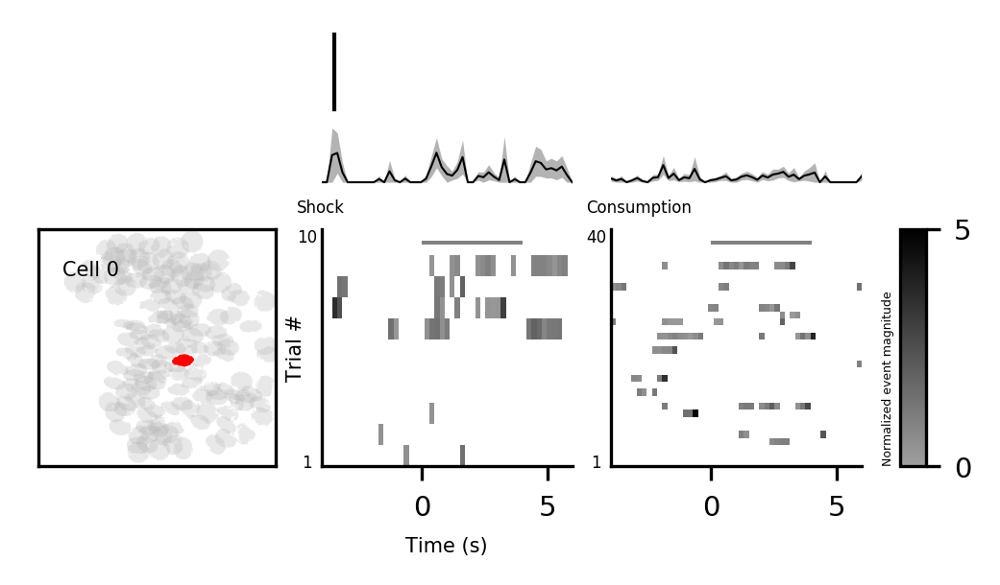

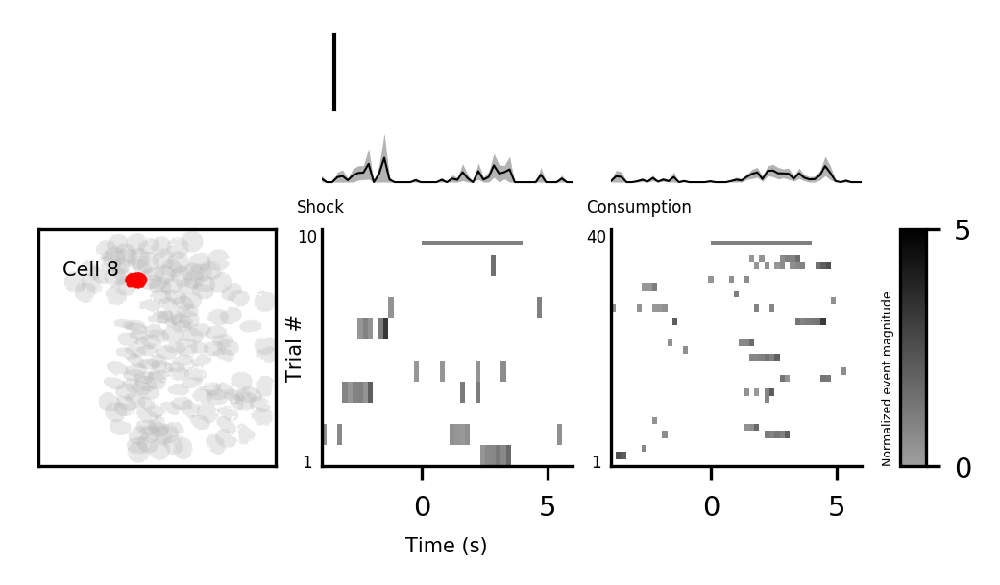

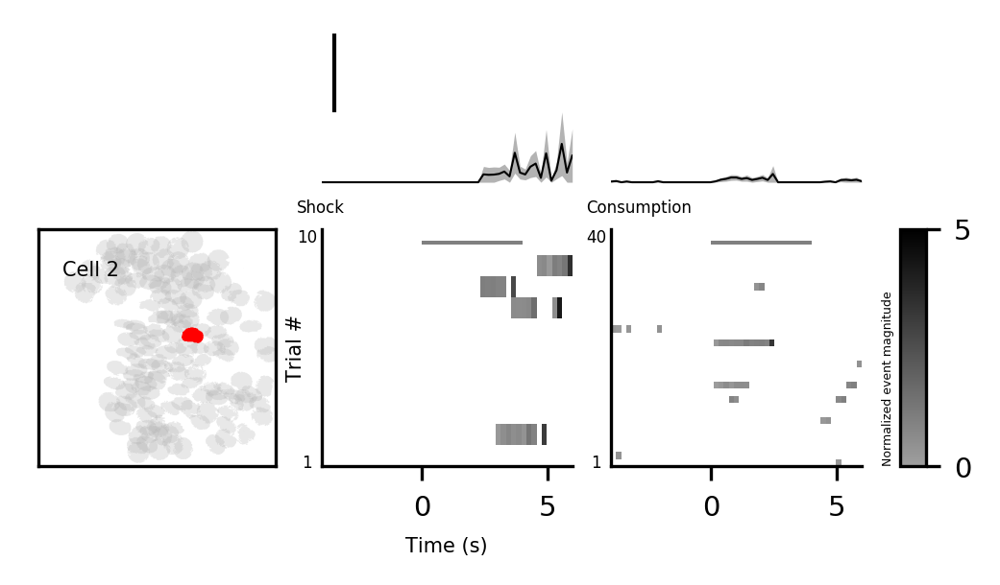

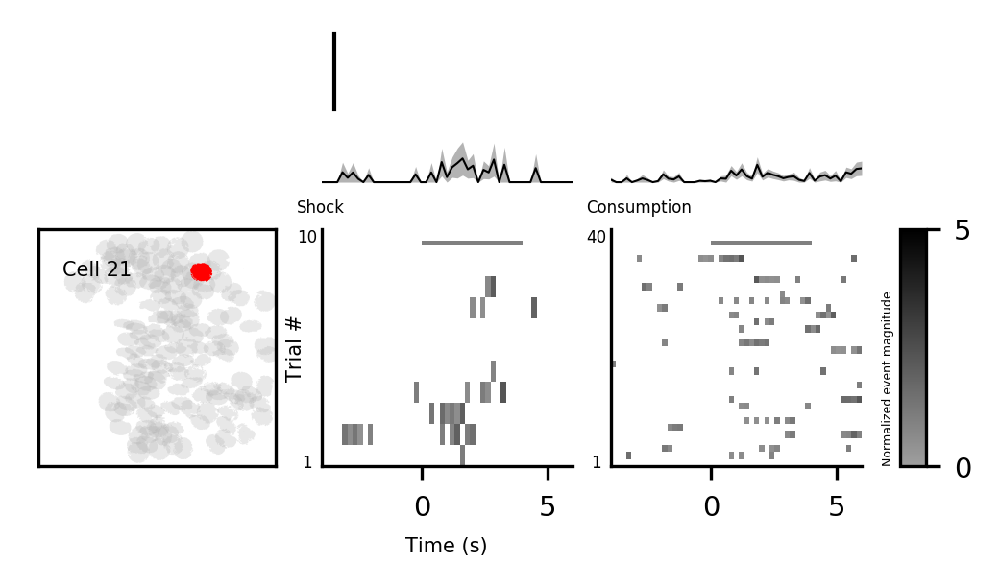

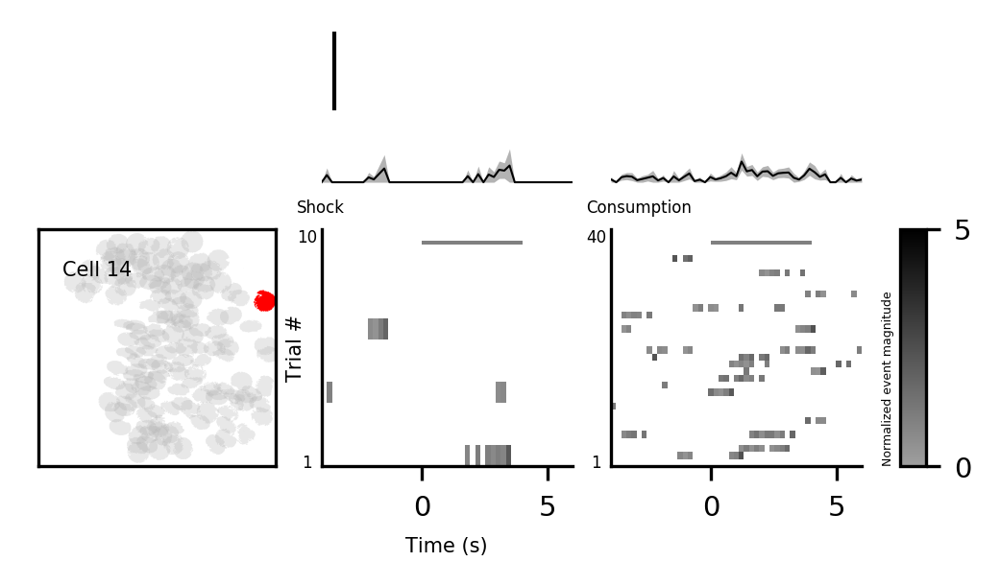

...

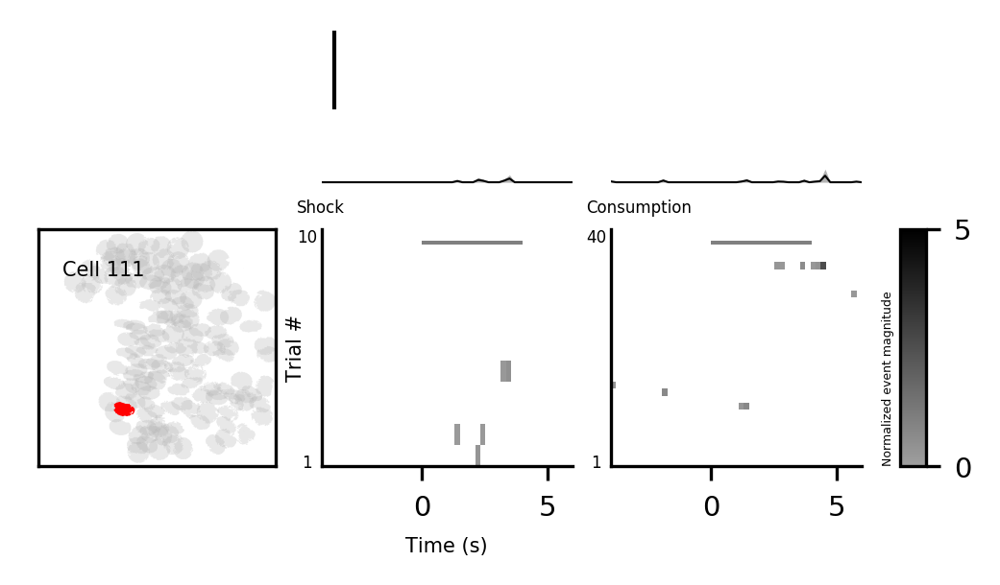

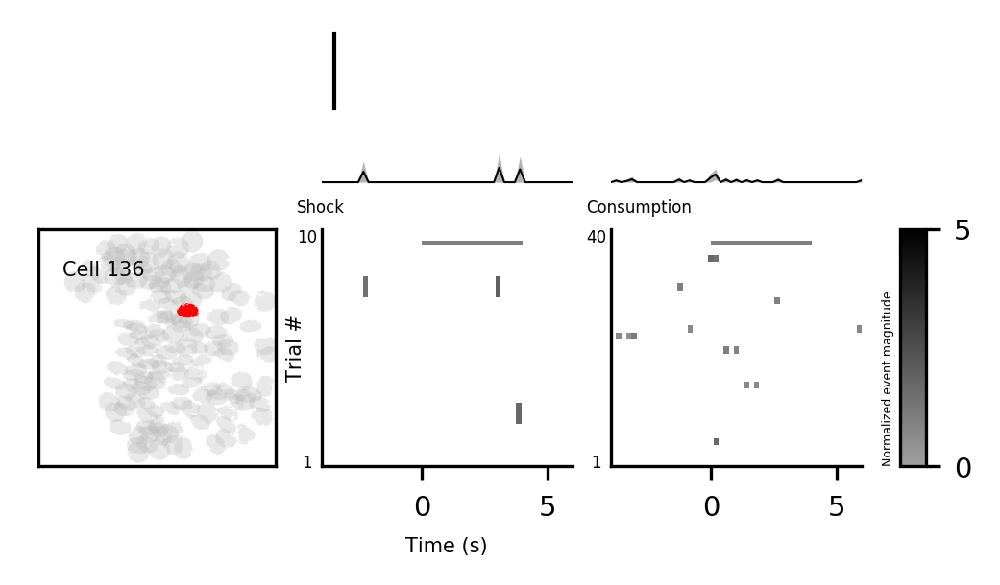

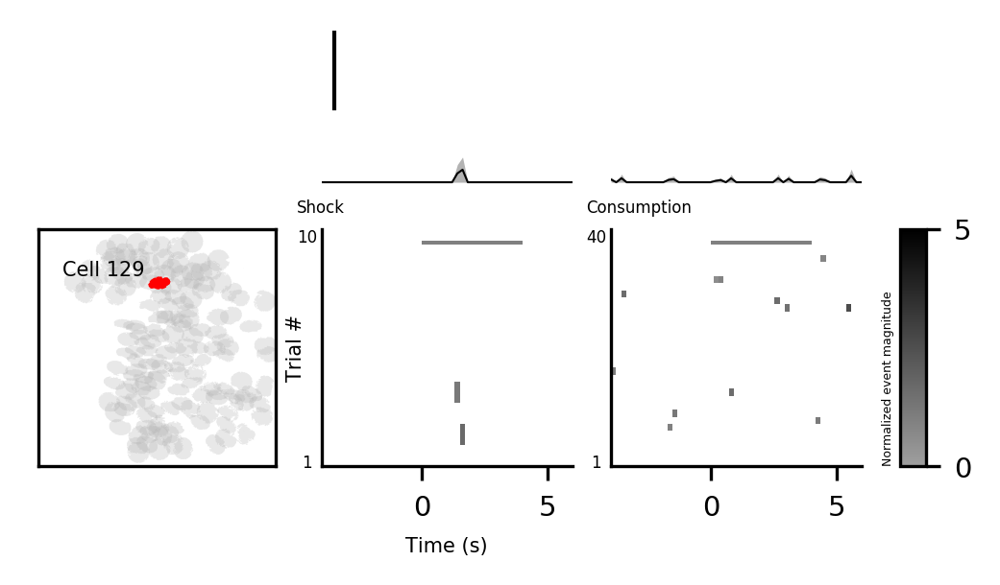

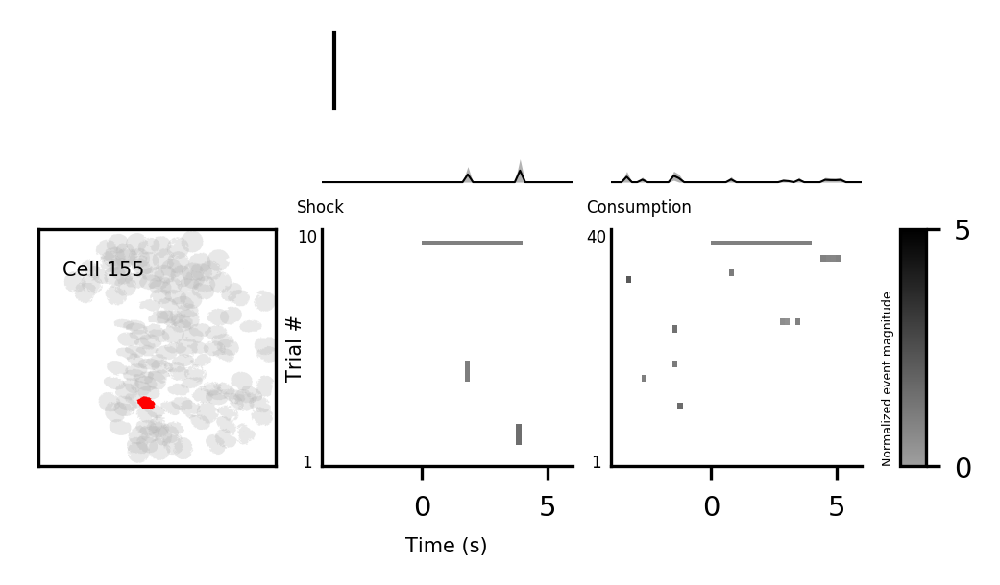

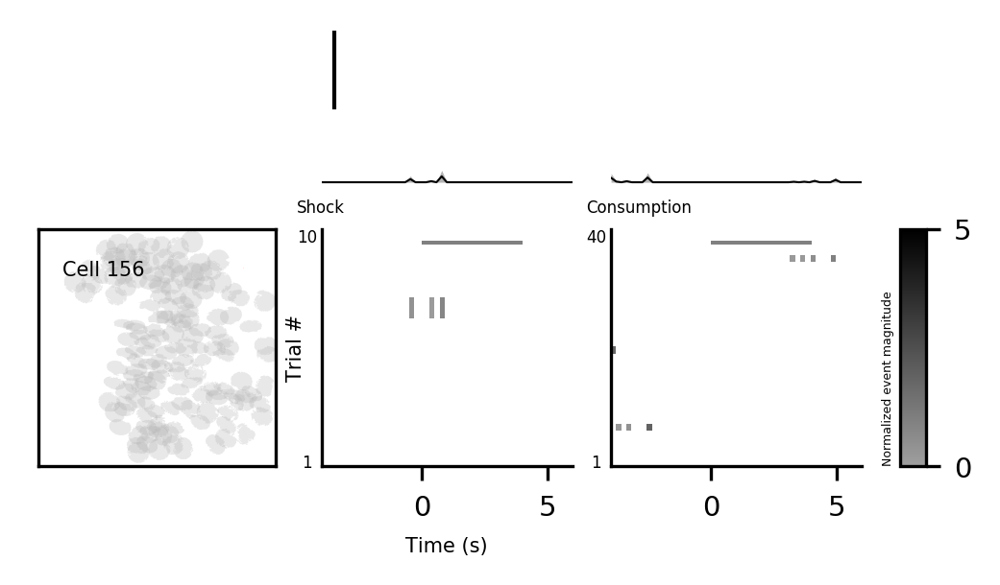

In [60]:
# cdict = {
#   'blue'  :  (0, 0, 1),
#   'red' :  (1, 0, 0)
# }
# cdict = {
#   'red'  :  ( (0.0, 0., 1), (0.0, 0, 0), (1., 1., 1.)),
#   'green':  ( (0.0, 0.0, 0.0), (0.0, 0, 0), (1., 1 .97)),
#   'blue' :  ( (0.0, 1.0, 1.0), (0.0, 0, 0), (1., 1, 0.45))
# }

# cm = colors.LinearSegmentedColormap('my_colormap', cdict, 1024)

# cells = range(len(selectivity['odor1']))
cells = np.argsort(events.sum(0))[::-1]

plot_panel(cells, cmap=pl.cm.gray_r, putnans=True, thr=False, vmin=-3, traces=True)

In [ ]:
# cdict = {
#   'blue'  :  (0, 0, 1),
#   'red' :  (1, 0, 0)
# }
# cdict = {
#   'red'  :  ( (0.0, 0., 1), (0.0, 0, 0), (1., 1., 1.)),
#   'green':  ( (0.0, 0.0, 0.0), (0.0, 0, 0), (1., 1 .97)),
#   'blue' :  ( (0.0, 1.0, 1.0), (0.0, 0, 0), (1., 1, 0.45))
# }

# cm = colors.LinearSegmentedColormap('my_colormap', cdict, 1024)

# cells = range(len(selectivity['odor1']))
cells = np.argsort(events.sum(0))[::-1]

cells = cells[len(cells)/(3/2):-1]

t_pre = 4
t_post = 4
thr=False
vmin=-3
traces=True
vmax=3
putnans=True
cmap=pl.cm.gray_r

fig, axs = pl.subplots(2*len(cells), 4, figsize=(4.5, 3*len(cells)),
                               gridspec_kw={'width_ratios':(1, 1, 1, .1),
                                            'height_ratios':(2, 3)*len(cells)},)
cell_n = 0
for cell in cells:
    # for cell in xrange(5):    
        im = plot_it(cell, shocks, shocks+1, axs[cell_n][1], axs[cell_n+1][1], t_pre=t_pre, t_post=t_post,
                     cmap=cmap, putnans=putnans, thr=thr, vmin=vmin, traces=traces, scale=True)
#         im.set_clim(vmin, vmax)
        plot_it(cell, consumptions, consumptionss+1, axs[cell_n][2], axs[cell_n+1][2], t_pre=t_pre, t_post=t_post,
                cmap=cmap, putnans=putnans, thr=thr, vmin=vmin, traces=traces)
        #ax = fig.add_axes((0.9, 0.2, 0.02, 0.6))
        ax = axs[cell_n+1][-1]
        fig.colorbar(im, cax=ax, orientation='vertical', ticks=(0, vmax), boundaries=np.linspace(0, vmax, 256))
        ax.set_xticks(())
        ax.set_yticks((0, 10))
        ax.text(-0.5, 0.7, 'Normalized event magnitude', rotation=90, ha='center', fontsize=3)
        pt.remove_axes(axs[cell_n][-1])

        for s in ax.spines.values():
            s.set_visible(False)
        for s in axs[cell_n][0].spines.values():
            s.set_visible(False)
        axs[cell_n][0].set_xticks(())
        axs[cell_n][0].set_yticks(())
        axs[cell_n+1][0].set_xticks(())
        axs[cell_n+1][0].set_yticks(())
        
        n_ax=0
        for ax in axs.T[1:]:
            ax[cell_n+1].set_yticks(())
            ymin, ymax = ax[cell_n+1].axis()[-2:]
            if n_ax ==0:
                ax[cell_n+1].fill_between([0, 1], ymax+ymax/20., ymax+ymax/20.+ymax/50., color='0.5', lw=0)
            elif n_ax==1:
                ax[cell_n+1].fill_between([0, 2], ymax+ymax/20., ymax+ymax/20.+ymax/50., color='0.5', lw=0)
            ax[cell_n].set_ylim(-0.1, 2)
            n_ax=n_ax+1
        axs[cell_n+1][1].set_xlabel('Time (s)', fontsize=5)
        # axs[0][1].text(29, 200, 'Cell %3d' % cell, fontsize=5, ha='center')
        
        axs[cell_n][1].text(-5, -.4, 'Shock', fontsize=4)
        axs[cell_n][2].text(-5, -.4, 'Reward', fontsize=4)
        axs[cell_n][1].text(-5, -.8, '10', fontsize=4)
        axs[cell_n][2].text(-5, -.8, '40', fontsize=4)
        axs[cell_n][1].text(-4.8, -3.8, '1', fontsize=4)
        axs[cell_n][2].text(-4.8, -3.8, '1', fontsize=4)
    
        axs[cell_n+1][1].set_ylabel('Trial #', fontsize=5)
        # axs[0][0].set_title('Air', fontsize=5)
        # axs[0][1].set_title('Banana', fontsize=5)
        # axs[0][2].set_title('Flower', fontsize=5)

        plot_patches(areas, [cell], ax=axs[cell_n+1][0], background=True, alpha=1)
        axs[cell_n+1][0].text(50, 100, "Cell %d"%cell, fontsize=5)

        #     fig.tight_layout()
    #     fig.subplots_adjust(bottom=0.3, left=0., right=0.75)
        cell_n=cell_n+2
#fig.savefig('../img/psth_all_cells_3of3.pdf')

In [18]:
save_workspace(db)

Could not store variable 'colors'. Skipping...
Could not store variable 'sstats'. Skipping...
Could not store variable 'IPython'. Skipping...
Could not store variable 'pt'. Skipping...
Could not store variable 'pl'. Skipping...
Could not store variable 'di'. Skipping...
Could not store variable 'ut'. Skipping...
Could not store variable 'ip'. Skipping...
Could not store variable 'np'. Skipping...
Could not store variable 'sys'. Skipping...
Could not store variable 'pickle'. Skipping...
Could not store variable 'os'. Skipping...
